# Introduction

## Importing Libraries

In [1]:
# Importing Libraries
import requests
import pandas as pd
import time
import json
import re
from sqlalchemy import create_engine
import pymysql.cursors
import os
import getpass
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from stop_words import get_stop_words
from PIL import Image

# Extending display
pd.set_option('display.max_colwidth', 1000)
pd.set_option('display.max_rows', 5000)


## Load Top Visited Countries data, Return List for API loop data collection

In [2]:
countries = pd.read_csv("Top_visited_countries.csv",sep=";")

In [3]:
len(countries)

49

In [4]:
# I am adding travels, because it will be used in the query search, 
countries["Country_travels"] = countries["Country_name"] + " travels"

In [5]:
countries.head()

,Country_id,Country_name,touristArrivals,Country_travels
0,1,France,89400000,France travels
1,2,Spain,83700000,Spain travels
2,3,United States,79300000,United States travels
3,4,China,65700000,China travels
4,5,Italy,64500000,Italy travels


In [6]:
# Getting a list to loop in for API requests
liste = list(countries["Country_travels"])

In [7]:
liste[0]

'France travels'

# Data Collection from Pexels API

## Testing with only France data collection

In [38]:
API_KEY = 'druWl4nMYQbXmLHTYVXWwes7BWPVYhwiVLF0zau8wnpp41xFBwvGhQ4q'  # Replace with your Pexels API key
url = 'https://api.pexels.com/v1/search'

# Set up the request headers with your API key
headers = {'Authorization': API_KEY}

# Set up the request parameters with the search keyword and the number of results to return
params = {'query': 'France', 'per_page': 80, 'page': 1}

# Send the API request
response = requests.get(url, headers=headers, params=params)

# Parse the response JSON to retrieve the search results
results = response.json()['photos']

In [40]:
# results is a list of dictionnaries, each dictionnary corresponds to one picture
results

[{'id': 2272939,
  'width': 5304,
  'height': 7072,
  'url': 'https://www.pexels.com/photo/france-flag-on-gray-concrete-building-near-road-2272939/',
  'photographer': 'Matt Hardy',
  'photographer_url': 'https://www.pexels.com/@matthardy',
  'photographer_id': 372053,
  'avg_color': '#81746E',
  'src': {'original': 'https://images.pexels.com/photos/2272939/pexels-photo-2272939.jpeg',
   'large2x': 'https://images.pexels.com/photos/2272939/pexels-photo-2272939.jpeg?auto=compress&cs=tinysrgb&dpr=2&h=650&w=940',
   'large': 'https://images.pexels.com/photos/2272939/pexels-photo-2272939.jpeg?auto=compress&cs=tinysrgb&h=650&w=940',
   'medium': 'https://images.pexels.com/photos/2272939/pexels-photo-2272939.jpeg?auto=compress&cs=tinysrgb&h=350',
   'small': 'https://images.pexels.com/photos/2272939/pexels-photo-2272939.jpeg?auto=compress&cs=tinysrgb&h=130',
   'portrait': 'https://images.pexels.com/photos/2272939/pexels-photo-2272939.jpeg?auto=compress&cs=tinysrgb&fit=crop&h=1200&w=800',
  

In [61]:
# Defining my dataframe structure (columns)
df = pd.DataFrame(columns=['ID', 'Width', 'Height', 'Tiny URL', 'Full URL', 'Photographer', 'Avg Color', 'Alt Text', 'Likes','Country_name'])

# Looping to fill my database
row_list = []
for result in results:
    row = pd.DataFrame({
        'ID': result['id'],
        'Width': result['width'],
        'Height': result['height'],
        'Tiny URL': result['src']['tiny'],
        'Full URL': result['url'],
        'Photographer': result['photographer'],
        'Avg Color': result['avg_color'],
        'Alt Text': result['alt'],
        'Likes': result['liked'],
        'Country_name' : 'France'
    }, index=[0])
    row_list.append(row)

df = pd.concat(row_list, ignore_index=True)

In [62]:
df

,ID,Width,Height,Tiny URL,Full URL,Photographer,Avg Color,Alt Text,Likes,Country_name
0,2272939,5304,7072,https://images.pexels.com/photos/2272939/pexel...,https://www.pexels.com/photo/france-flag-on-gr...,Matt Hardy,#81746E,France Flag on Gray Concrete Building Near Road,False,France
1,2901215,5046,4037,https://images.pexels.com/photos/2901215/pexel...,https://www.pexels.com/photo/photography-of-bu...,Pierre Blaché,#273339,Photography of Buildings and Canal during Nigh...,False,France
2,2309272,5184,6912,https://images.pexels.com/photos/2309272/pexel...,https://www.pexels.com/photo/low-angle-photogr...,Matt Hardy,#9E9996,Low-angle Photography of Gray Castle,False,France
3,2901209,5966,3356,https://images.pexels.com/photos/2901209/pexel...,https://www.pexels.com/photo/canal-beside-hous...,Pierre Blaché,#384859,Canal Beside Houses,False,France
4,3290065,3200,4800,https://images.pexels.com/photos/3290065/pexel...,https://www.pexels.com/photo/lighted-eiffel-to...,Alex Azabache,#39362E,Lighted Eiffel Tower in Paris,False,France
...,...,...,...,...,...,...,...,...,...,...
75,548077,2592,3888,https://images.pexels.com/photos/548077/pexels...,https://www.pexels.com/photo/galeries-lafayett...,Margerretta,#949184,Galeries Lafayette Building,False,France
76,161901,2371,1536,https://images.pexels.com/photos/161901/paris-...,https://www.pexels.com/photo/crowded-street-wi...,Pixabay,#5F4B48,Crowded Street With Cars Along Arc De Triomphe,False,France
77,532826,5184,3456,https://images.pexels.com/photos/532826/pexels...,https://www.pexels.com/photo/architecture-blue...,Pixabay,#4373A2,"Eiffel Tower, Paris",False,France
78,1694359,5152,3864,https://images.pexels.com/photos/1694359/pexel...,https://www.pexels.com/photo/photo-of-town-169...,Niki Nagy,#B2AC9F,Photo Of Town,False,France


In [21]:
# testing time sleep to avoid being called out by the API for bulk retrieval
print("hello")
time.sleep(3) # Sleep for 3 second
print("kevin")

hello
kevin


## Bulk Data extraction from API, Dataframe formatting & saving

### Pipeline

In [12]:
# Comment or Uncomment what is needed

# all_results = api_extract(80,1)

#with open('all_results.json', 'w') as f:
    # Write the contents of all_results as a JSON string to the file
    # json.dump(all_results, f)

with open('all_results.json') as f:
    all_results = json.load(f)

df = create_df()

cleaned_df = df_cleaning(df)

photographers_df, main_df = process_dataframe(cleaned_df)

### Defining Functions for the pipeline

#### API data collection function (output: JSON files for all countries)

In [101]:
# Let's define a function to extract our data from Pexels API and store in "all_results" (aggreg. of all JSON files)

def api_extract(pictures_count,nb_page):
    
    url = 'https://api.pexels.com/v1/search'
    # list that we have defined in the first part, "country + travels"
    countries = liste

    # Create an empty list to store all the search results
    all_results = []

    # Loop through the list of countries and retrieve photos for each country
    for country in countries:
        # Set up the request headers with my API key
        headers = {'Authorization': API_KEY}

        # Set up the request parameters with the search keyword and the number of results to return
        params = {'query': country, 'per_page': pictures_count, 'page': nb_page}

        # Send the API request
        response = requests.get(url, headers=headers, params=params)

        # Parse the response JSON to retrieve the search results
        results = response.json()['photos']

        # Append the search results to the all_results list
        all_results.extend(results)
    
        # Pause for a few seconds between requests to avoid hitting the API limit or being called out 
        time.sleep(3)
        
    return all_results

In [100]:
# 80 is the max pictures per retrieval, and 1 refers to the first page results
all_results = api_extract(80,1)

In [112]:
# Saving my JSON agg. files since it takes some time to retrieve
with open('all_results.json', 'w') as f:
    # Write the contents of all_results as a JSON string to the file
    json.dump(all_results, f)

In [9]:
with open('all_results.json') as f:
    all_results = json.load(f)

In [13]:
all_results

[{'id': 13918727,
  'width': 5304,
  'height': 7952,
  'url': 'https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/',
  'photographer': 'Eugenia Remark',
  'photographer_url': 'https://www.pexels.com/@eugenia-remark-5767088',
  'photographer_id': 5767088,
  'avg_color': '#5E5141',
  'src': {'original': 'https://images.pexels.com/photos/13918727/pexels-photo-13918727.jpeg',
   'large2x': 'https://images.pexels.com/photos/13918727/pexels-photo-13918727.jpeg?auto=compress&cs=tinysrgb&dpr=2&h=650&w=940',
   'large': 'https://images.pexels.com/photos/13918727/pexels-photo-13918727.jpeg?auto=compress&cs=tinysrgb&h=650&w=940',
   'medium': 'https://images.pexels.com/photos/13918727/pexels-photo-13918727.jpeg?auto=compress&cs=tinysrgb&h=350',
   'small': 'https://images.pexels.com/photos/13918727/pexels-photo-13918727.jpeg?auto=compress&cs=tinysrgb&h=130',
   'portrait': 'https://images.pexels.com/photos/13918727/pexels-photo-13918727.jpeg?auto=com

#### Transforming JSON agg. files to DataFrame

In [9]:
def create_df():
    # Create the frame with columns name
    df = pd.DataFrame(columns=['Pictures_id', 'Width', 'Height', 'Full URL', 'Photographer_id','Photographer', 'Avg Color', 'Description', 'Country_id'])
    for i, result in enumerate(all_results):
        # Make sure it matches with above for columns name
        row = pd.DataFrame({
                'Pictures_id': result['id'],
                'Width': result['width'],
                'Height': result['height'],
                #'Tiny URL': result['src']['tiny'],
                'Full URL': result['url'],
                'Photographer_id': result['photographer_id'],
                'Photographer': result['photographer'],
                'Avg Color': result['avg_color'],
                'Description': result['alt'],
                'Likes': result['liked'],
                'Country_id': (i // 80) + 1 # increment every 80 rows
            }, index=[0])
        # iterating and building back the country_id
        df = pd.concat([df,row], ignore_index=True)
    return df

In [118]:
df = create_df()

In [119]:
df

,Pictures_id,Width,Height,Full URL,Photographer_id,Photographer,Avg Color,Description,Country_id,Likes
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,Eugenia Remark,#5E5141,Black Statue of Man on Top of Building,1,False
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,paul jousseau,#6C635C,Photo of a Mont San Michele Abbey in France,1,False
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,Jill Evans,#7B7B79,Concrete Building View from Balcony,1,False
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,Polina Chistyakova,#979CA2,Eiffel Tower and Seine,1,False
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,Pixabay,#8E5F38,Clear Glass Museum during Golden Hour,1,False
5,2886284,3328,4992,https://www.pexels.com/photo/white-and-brown-house-2886284/,557790,Vincent M.A. Janssen,#2C4C57,White and Brown House,1,False
6,2901209,5966,3356,https://www.pexels.com/photo/canal-beside-houses-2901209/,651604,Pierre Blaché,#384859,Canal Beside Houses,1,False
7,1125212,3456,5184,https://www.pexels.com/photo/eiffel-tower-paris-1125212/,409034,Marcin Gierbisz,#345D6E,"Eiffel Tower, Paris",1,False
8,3073666,3938,4923,https://www.pexels.com/photo/concrete-houses-and-green-trees-photo-3073666/,651604,Pierre Blaché,#3E4642,Concrete Houses and Green Trees Photo,1,False
9,2901215,5046,4037,https://www.pexels.com/photo/photography-of-buildings-and-canal-during-nighttime-2901215/,651604,Pierre Blaché,#273339,Photography of Buildings and Canal during Nighttime,1,False


# Data cleaning and Exporting

In [26]:
df["Likes"].value_counts()

False    3920
Name: Likes, dtype: int64

In [70]:
df.isnull().sum()

Pictures_id        0
Width              0
Height             0
Full URL           0
Photographer_id    0
Photographer       0
Avg Color          0
Description        0
Country_id         0
Likes              0
dtype: int64

In [10]:
def df_cleaning(df):
    # even though I don't have null or duplicates
    cleaned_df = df.drop_duplicates(subset = "Pictures_id").dropna()
    # anticipating SQL loading or text processing later, I prefer to remove special characters for desc and photographer name
    special_chars = {
        "[éèêë]": "e",
        "[áàâäãå]": "a",
        "[óòôöõ]": "o",
        "[úùûü]": "u",
        "[íïî]": "i",
        "[ñ]": "n",
        "[ç]": "c",
        "[ß]": "ss"
    }
    for pattern, replacement in special_chars.items():
        cleaned_df['Photographer'] = cleaned_df['Photographer'].apply(lambda x: re.sub(pattern, replacement, str(x), flags=re.IGNORECASE))
        cleaned_df['Photographer'] = cleaned_df['Photographer'].str.lower()  # convert to lowercase
        cleaned_df['Description'] = cleaned_df['Description'].apply(lambda x: re.sub(pattern, replacement, str(x), flags=re.IGNORECASE))
        cleaned_df['Description'] = cleaned_df['Description'].str.lower()  # convert to lowercase
    return cleaned_df

In [129]:
cleaned_df = df_cleaning(df)
cleaned_df

,Pictures_id,Width,Height,Full URL,Photographer_id,Photographer,Avg Color,Description,Country_id,Likes
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,eugenia remark,#5E5141,black statue of man on top of building,1,False
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,paul jousseau,#6C635C,photo of a mont san michele abbey in france,1,False
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,jill evans,#7B7B79,concrete building view from balcony,1,False
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,polina chistyakova,#979CA2,eiffel tower and seine,1,False
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,pixabay,#8E5F38,clear glass museum during golden hour,1,False
5,2886284,3328,4992,https://www.pexels.com/photo/white-and-brown-house-2886284/,557790,vincent m.a. janssen,#2C4C57,white and brown house,1,False
6,2901209,5966,3356,https://www.pexels.com/photo/canal-beside-houses-2901209/,651604,pierre blache,#384859,canal beside houses,1,False
7,1125212,3456,5184,https://www.pexels.com/photo/eiffel-tower-paris-1125212/,409034,marcin gierbisz,#345D6E,"eiffel tower, paris",1,False
8,3073666,3938,4923,https://www.pexels.com/photo/concrete-houses-and-green-trees-photo-3073666/,651604,pierre blache,#3E4642,concrete houses and green trees photo,1,False
9,2901215,5046,4037,https://www.pexels.com/photo/photography-of-buildings-and-canal-during-nighttime-2901215/,651604,pierre blache,#273339,photography of buildings and canal during nighttime,1,False


In [97]:
# From my cleaned dataframe, i want to:
    # get a smaller database with photographer_id and photographer (removing duplicates)
    # remove phothographer and likes (constant) columns
    # save on local folder 

In [84]:
photographers_df = cleaned_df[['Photographer_id', 'Photographer']]
photographers_df

,Photographer_id,Photographer
0,5767088,Eugenia Remark
1,406314056,paul jousseau
2,956039,Jill Evans
3,1245209,Polina Chistyakova
4,2659,Pixabay
5,557790,Vincent M.A. Janssen
6,651604,Pierre Blache
7,409034,Marcin Gierbisz
8,651604,Pierre Blache
9,651604,Pierre Blache


In [11]:
def process_dataframe(df):
    # Create smaller dataframe with unique Photographer IDs and names
    photographers_df = df[['Photographer_id', 'Photographer']].drop_duplicates()
    
    # Remove Likes (constant) and Photographer_id columns from initial DataFrame
    main_df = df.drop(['Likes', 'Photographer'], axis=1)
    
    return photographers_df, main_df

In [104]:
photographers_df, main_df = process_dataframe(cleaned_df)

In [133]:
#photographers_df.to_csv("photographers_df.csv",index=False)
#main_df.to_csv("main_df.csv",index=False)

In [134]:
main_df.shape

(3920, 8)

In [135]:
main_df.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Avg Color,Description,Country_id
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,#5E5141,black statue of man on top of building,1
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,#6C635C,photo of a mont san michele abbey in france,1
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,#7B7B79,concrete building view from balcony,1
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,#979CA2,eiffel tower and seine,1
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,#8E5F38,clear glass museum during golden hour,1


# Loading Countries/Region dataset and Building HEX into RGB table

## Creating Countries Mapping table

In [13]:
# loading a countries mapping dataset to be abble to assign France to Europe for instance
countries_mapping = pd.read_csv("countries_mapping.csv",sep=";")

In [14]:
countries_mapping.head()

,name,alpha-2,alpha-3,country-code,iso_3166-2,region,sub-region,intermediate-region,region-code,sub-region-code,intermediate-region-code,Unnamed: 11
0,Afghanistan,AF,AFG,4,ISO 3166-2:AF,Asia,Southern Asia,NaN,142,34.0,NaN,NaN
1,Åland Islands,AX,ALA,248,ISO 3166-2:AX,Europe,Northern Europe,NaN,150,154.0,NaN,NaN
2,Albania,AL,ALB,8,ISO 3166-2:AL,Europe,Southern Europe,NaN,150,39.0,NaN,NaN
3,Algeria,DZ,DZA,12,ISO 3166-2:DZ,Africa,Northern Africa,NaN,2,15.0,NaN,NaN
4,American Samoa,AS,ASM,16,ISO 3166-2:AS,Oceania,Polynesia,NaN,9,61.0,NaN,NaN


In [15]:
countries.head()

,Country_id,Country_name,touristArrivals,Country_travels
0,1,France,89400000,France travels
1,2,Spain,83700000,Spain travels
2,3,United States,79300000,United States travels
3,4,China,65700000,China travels
4,5,Italy,64500000,Italy travels


In [16]:
# I am now going to merge these two dfs (adding region and sub region to the first one) and joining on country names
merged_countries = pd.merge(countries, countries_mapping[['name', 'region', 'sub-region']],left_on='Country_name', right_on='name')
merged_countries.head()

,Country_id,Country_name,touristArrivals,Country_travels,name,region,sub-region
0,1,France,89400000,France travels,France,Europe,Western Europe
1,2,Spain,83700000,Spain travels,Spain,Europe,Southern Europe
2,3,United States,79300000,United States travels,United States,Americas,Northern America
3,4,China,65700000,China travels,China,Asia,Eastern Asia
4,5,Italy,64500000,Italy travels,Italy,Europe,Southern Europe


In [17]:
# dropping name which is redundant and Country_travels since I don't need it anymore
merged_countries.drop(['name','Country_travels'], axis=1, inplace=True)
merged_countries.head()

,Country_id,Country_name,touristArrivals,region,sub-region
0,1,France,89400000,Europe,Western Europe
1,2,Spain,83700000,Europe,Southern Europe
2,3,United States,79300000,Americas,Northern America
3,4,China,65700000,Asia,Eastern Asia
4,5,Italy,64500000,Europe,Southern Europe


## Creating HEX / RGB table

In [18]:
main_df.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Avg Color,Description,Country_id
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,#5E5141,black statue of man on top of building,1
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,#6C635C,photo of a mont san michele abbey in france,1
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,#7B7B79,concrete building view from balcony,1
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,#979CA2,eiffel tower and seine,1
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,#8E5F38,clear glass museum during golden hour,1


In [19]:
main_df["Avg Color"].nunique()

3618

In [20]:
# I am creating a df which contains unique rows of Hex, it will be used as a mapping once I add the RGB columns
unique_colors_df = pd.DataFrame(main_df['Avg Color'].unique(), columns=['Hex'])
unique_colors_df.head()

,Hex
0,#5E5141
1,#6C635C
2,#7B7B79
3,#979CA2
4,#8E5F38


In [21]:
# I discover that we could turn a HEX to RGB using the "hexadecimal"  applied to 
# define a function to convert hexadecimal color codes to RGB values
def hex_to_rgb(hex_code):
    hex_code = hex_code.lstrip('#')
    return tuple(int(hex_code[i:i+2], 16) for i in (0, 2, 4))

# apply the 'hex_to_rgb' function to the 'Hex' column of the DataFrame
unique_colors_df[['R', 'G', 'B']] = pd.DataFrame(unique_colors_df['Hex'].apply(hex_to_rgb).tolist())

In [22]:
unique_colors_df.head()

,Hex,R,G,B
0,#5E5141,94,81,65
1,#6C635C,108,99,92
2,#7B7B79,123,123,121
3,#979CA2,151,156,162
4,#8E5F38,142,95,56


# Exporting dataframes to MySQL

In [166]:
# merged_countries
# unique_colors_df
# main_df
# photographers_df

In [204]:
merged_countries

,Country_id,Country_name,touristArrivals,region,sub-region
0,1,France,89400000,Europe,Western Europe
1,2,Spain,83700000,Europe,Southern Europe
2,3,United States,79300000,Americas,Northern America
3,4,China,65700000,Asia,Eastern Asia
4,5,Italy,64500000,Europe,Southern Europe
5,6,Turkey,51200000,Asia,Western Asia
6,7,Mexico,45000000,Americas,Latin America and the Caribbean
7,8,Thailand,39800000,Asia,South-eastern Asia
8,9,Germany,39600000,Europe,Western Europe
9,10,United Kingdom,39400000,Europe,Northern Europe


In [168]:
unique_colors_df.head()

,Hex,R,G,B
0,#5E5141,94,81,65
1,#6C635C,108,99,92
2,#7B7B79,123,123,121
3,#979CA2,151,156,162
4,#8E5F38,142,95,56


In [169]:
main_df.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Avg Color,Description,Country_id
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,#5E5141,black statue of man on top of building,1
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,#6C635C,photo of a mont san michele abbey in france,1
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,#7B7B79,concrete building view from balcony,1
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,#979CA2,eiffel tower and seine,1
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,#8E5F38,clear glass museum during golden hour,1


In [170]:
photographers_df.head()

,Photographer_id,Photographer
0,5767088,eugenia remark
1,406314056,paul jousseau
2,956039,jill evans
3,1245209,polina chistyakova
4,2659,pixabay


In [180]:
pw = getpass.getpass()
connection_string = 'mysql+pymysql://root:' + pw + '@localhost:3306/'
engine = create_engine(connection_string)

········


In [183]:
#merged_countries.to_sql('countries_mapping', engine, 'Final_Project', if_exists='replace', index = False)

49

In [185]:
#unique_colors_df.to_sql('colors_mapping', engine, 'Final_Project', if_exists='replace', index = False)

3618

In [203]:
#main_df.to_sql('api_data', engine, 'Final_Project', if_exists='replace', index = False)

3682

In [187]:
#photographers_df.to_sql('photographers_mapping', engine, 'Final_Project', if_exists='replace', index = False)

1515

In [197]:
#unique_colors_df.drop_duplicates(subset = "Hex",inplace=True)

# Mergin ALL dataframes into one for EDA

In [207]:
main_df.shape

(3682, 8)

In [208]:
main_df.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Avg Color,Description,Country_id
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,#5E5141,black statue of man on top of building,1
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,#6C635C,photo of a mont san michele abbey in france,1
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,#7B7B79,concrete building view from balcony,1
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,#979CA2,eiffel tower and seine,1
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,#8E5F38,clear glass museum during golden hour,1


In [23]:
def merge_dataframes(merged_countries, unique_colors_df, main_df, photographers_df):
    # Merge main_df with merged_countries dataframe on country_id
    main_merged = pd.merge(main_df, merged_countries, on='Country_id', how='left')
    
    # Merge main_merged with unique_colors_df dataframe on Avg Color (Hex)
    main_merged = pd.merge(main_merged, unique_colors_df, left_on='Avg Color', right_on='Hex')
    
    # Merge main_merged with photographers_df dataframe on Photographer_id
    main_merged = pd.merge(main_merged, photographers_df, on='Photographer_id', how='left')
    
    main_merged = main_merged.drop(['Avg Color', 'touristArrivals'], axis=1)

    return main_merged

In [24]:
main_merged = merge_dataframes(merged_countries, unique_colors_df, main_df, photographers_df)

In [25]:
main_merged.shape

(3682, 15)

In [26]:
main_merged.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Description,Country_id,Country_name,region,sub-region,Hex,R,G,B,Photographer
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,black statue of man on top of building,1,France,Europe,Western Europe,#5E5141,94,81,65,eugenia remark
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,photo of a mont san michele abbey in france,1,France,Europe,Western Europe,#6C635C,108,99,92,paul jousseau
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,concrete building view from balcony,1,France,Europe,Western Europe,#7B7B79,123,123,121,jill evans
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,eiffel tower and seine,1,France,Europe,Western Europe,#979CA2,151,156,162,polina chistyakova
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,clear glass museum during golden hour,1,France,Europe,Western Europe,#8E5F38,142,95,56,pixabay


In [219]:
main_merged.to_csv("main_merged.csv",index=False)

# EDA

In [312]:
main_merged = pd.read_csv("main_merged.csv", sep=",")

In [313]:
main_merged.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Description,Country_id,Country_name,region,sub-region,Hex,R,G,B,Photographer
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,black statue of man on top of building,1,France,Europe,Western Europe,#5E5141,94,81,65,eugenia remark
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,photo of a mont san michele abbey in france,1,France,Europe,Western Europe,#6C635C,108,99,92,paul jousseau
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,concrete building view from balcony,1,France,Europe,Western Europe,#7B7B79,123,123,121,jill evans
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,eiffel tower and seine,1,France,Europe,Western Europe,#979CA2,151,156,162,polina chistyakova
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,clear glass museum during golden hour,1,France,Europe,Western Europe,#8E5F38,142,95,56,pixabay


## Colors

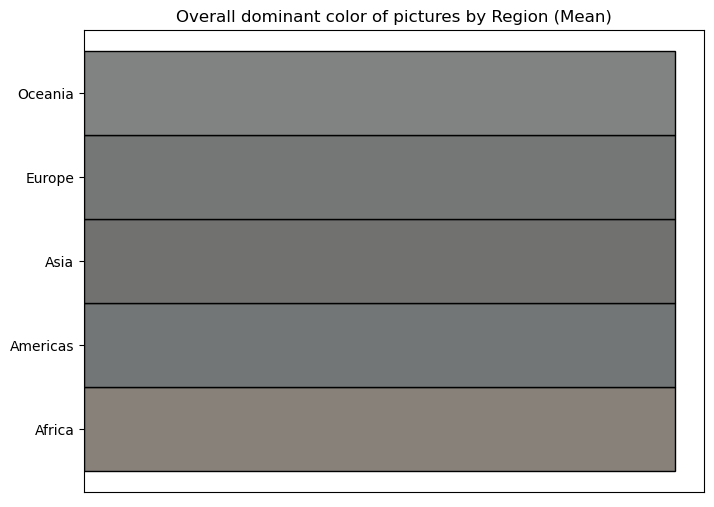

In [323]:
# group by region and get the mean RGB values
palette = main_merged.groupby('region')[['R', 'G', 'B']].mean()
palette.reset_index(inplace=True)

# divide RGB values by 255, so that I can input it in the plot colors
palette[['R', 'G', 'B']] = palette[['R', 'G', 'B']].div(255)

# settings
fig, ax = plt.subplots(figsize=(8,6))

# create a bar chart
regions = palette['region']
colors = np.array(palette[['R', 'G', 'B']])

# creating horizontal bar for each region and associating the color with its mean RGB
for i, region in enumerate(regions):
    ax.barh(i, 1, color=colors[i], edgecolor='black', height=1)

# set the tick labels and title
ax.set_yticks(np.arange(len(regions)))
ax.set_yticklabels(regions)
ax.set_xticks([])
ax.set_title('Overall dominant color of pictures by Region (Mean)')
plt.show()

In [319]:
avg_rgb_by_region = main_merged.groupby('region')[['R', 'G', 'B']].mean()

In [320]:
avg_rgb_by_region

,R,G,B
region,,,
Africa,135.058020,128.965870,121.634812
Americas,114.367925,117.977987,118.015723
Asia,113.056277,114.172439,111.663781
Europe,116.385572,119.133085,117.338930
Oceania,128.766234,131.285714,130.753247


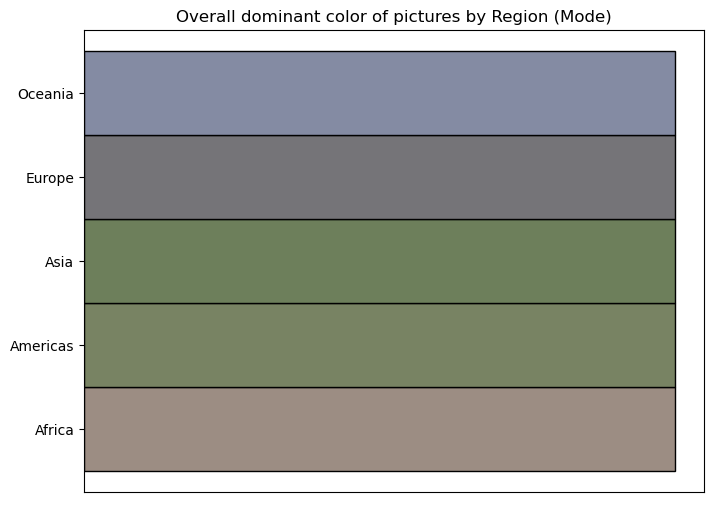

In [324]:
# It seems like using mean as previously done is misleading, it could lead to think that our dataset contains only black & white pictures

# group by region and get the mode RGB values
palette = main_merged.groupby('region')[['R', 'G', 'B']].agg(lambda x: x.value_counts().index[0])
palette.reset_index(inplace=True)

# divide RGB values by 255
palette[['R', 'G', 'B']] = palette[['R', 'G', 'B']].div(255)

fig, ax = plt.subplots(figsize=(8,6))

# create the bar chart
regions = palette['region']
colors = np.array(palette[['R', 'G', 'B']])

for i, region in enumerate(regions):
    ax.barh(i, 1, color=colors[i], edgecolor='black', height=1)

# set the tick labels and title
ax.set_yticks(np.arange(len(regions)))
ax.set_yticklabels(regions)
ax.set_xticks([])
ax.set_title('Overall dominant color of pictures by Region (Mode)')
plt.show()

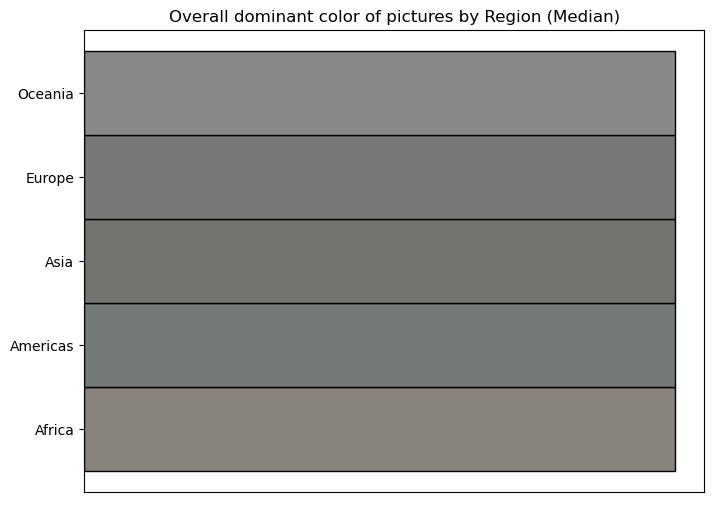

In [325]:
# group by region and get the median RGB values
palette = main_merged.groupby('region')[['R', 'G', 'B']].median()
palette.reset_index(inplace=True)

# divide RGB values by 255
palette[['R', 'G', 'B']] = palette[['R', 'G', 'B']].div(255)

# create a bar chart
fig, ax = plt.subplots(figsize=(8,6))

# create the bar chart
regions = palette['region']
colors = np.array(palette[['R', 'G', 'B']])

for i, region in enumerate(regions):
    ax.barh(i, 1, color=colors[i], edgecolor='black', height=1)

# set the tick labels and title
ax.set_yticks(np.arange(len(regions)))
ax.set_yticklabels(regions)
ax.set_xticks([])
ax.set_title('Overall dominant color of pictures by Region (Median)')
plt.show()

In [243]:
palette = main_merged.groupby('region')[['R', 'G', 'B']].agg(lambda x: x.value_counts().index[0])
palette

,R,G,B
region,,,
Africa,156,141,131
Americas,120,131,99
Asia,109,127,91
Europe,117,116,120
Oceania,132,139,163


In [254]:
#main_merged.groupby("Country_name")["R"].value_counts()

## Dimensions

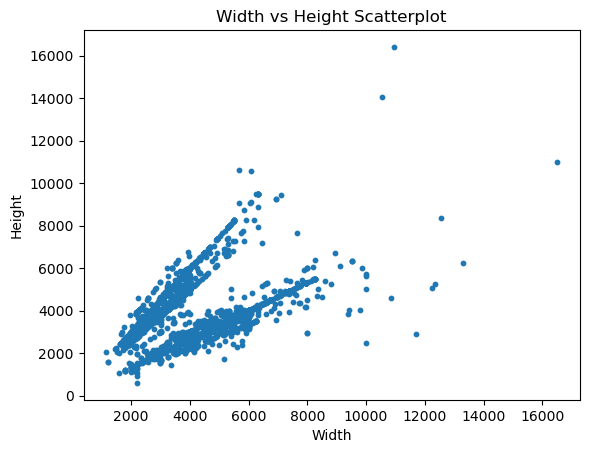

In [328]:
# Let's do a scatterplot for width and height
plt.scatter(main_merged['Width'], main_merged['Height'], s=10)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Width vs Height Scatterplot')
plt.show()

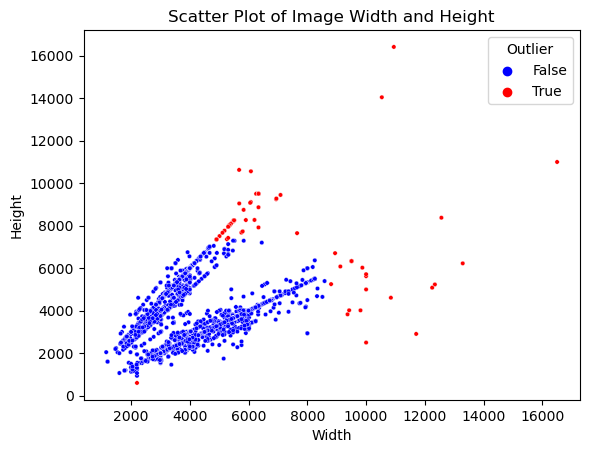

In [330]:
# calculate the interquartile range (IQR) for both width and height
Q1_w, Q3_w = main_merged['Width'].quantile([0.25, 0.75])
IQR_w = Q3_w - Q1_w
Q1_h, Q3_h = main_merged['Height'].quantile([0.25, 0.75])
IQR_h = Q3_h - Q1_h

# calculate the upper and lower bounds for outliers
upper_bound_w = Q3_w + 1.5 * IQR_w
lower_bound_w = Q1_w - 1.5 * IQR_w
upper_bound_h = Q3_h + 1.5 * IQR_h
lower_bound_h = Q1_h - 1.5 * IQR_h

# create a new column 'Outlier' with True for outliers and False for non-outliers
main_merged['Outlier'] = ((main_merged['Width'] > upper_bound_w) | (main_merged['Width'] < lower_bound_w) |
                          (main_merged['Height'] > upper_bound_h) | (main_merged['Height'] < lower_bound_h))

# create a scatter plot with different colors for outliers and non-outliers
sns.scatterplot(data=main_merged, x='Width', y='Height', hue='Outlier', palette={True: 'red', False: 'blue'}, s=10)

# set the plot title and axis labels
plt.title('Scatter Plot of Image Width and Height')
plt.xlabel('Width')
plt.ylabel('Height')

# display the plot
plt.show()

<AxesSubplot:xlabel='aspect_ratio', ylabel='Density'>

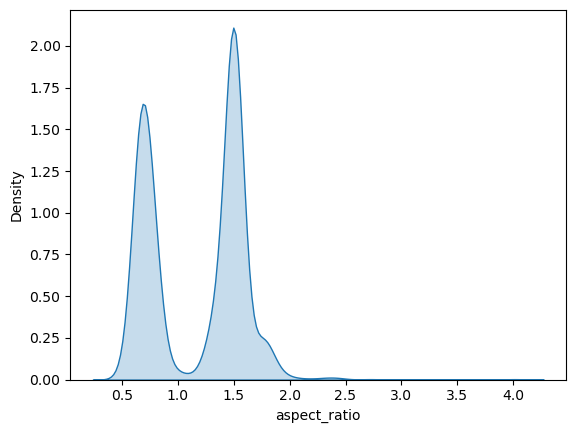

In [331]:
# calculate aspect ratio
main_merged['aspect_ratio'] = main_merged['Width'] / main_merged['Height']

# create kernel density plot
sns.kdeplot(main_merged['aspect_ratio'], shade=True)

In [333]:
# Define a function to categorize aspect ratios
def categorize_aspect_ratio(ratio):
    if ratio >= 1.5:
        return "landscape orientation"
    elif ratio < 1:
        return "portrait orientation"
    else:
        return "other"

# Apply the function to create a new column "orientation"
main_merged["orientation"] = main_merged["aspect_ratio"].apply(categorize_aspect_ratio)

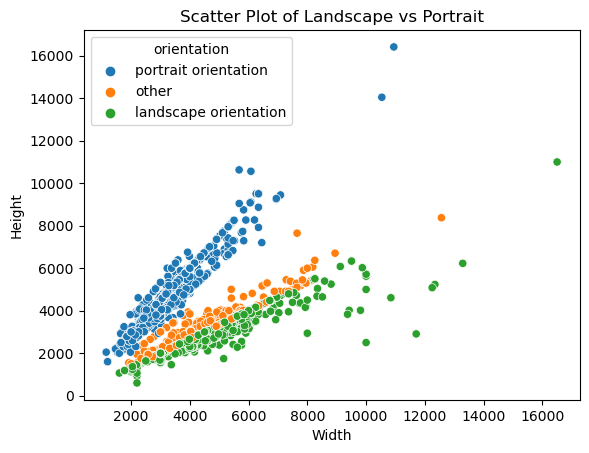

In [340]:
sns.scatterplot(data=main_merged, x="Width", y="Height", hue="orientation")
plt.title('Scatter Plot of Landscape vs Portrait')
plt.xlabel('Width')
plt.ylabel('Height')
plt.show()

In [335]:
main_merged.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Description,Country_id,Country_name,region,sub-region,Hex,R,G,B,Photographer,Outlier,aspect_ratio,orientation
0,13918727,5304,7952,https://www.pexels.com/photo/sculpture-and-streetlight-near-eiffel-tower-in-paris-france-13918727/,5767088,black statue of man on top of building,1,France,Europe,Western Europe,#5E5141,94,81,65,eugenia remark,True,0.667002,portrait orientation
1,14918481,2000,2500,https://www.pexels.com/photo/photo-of-a-mont-san-michele-abbey-in-france-14918481/,406314056,photo of a mont san michele abbey in france,1,France,Europe,Western Europe,#6C635C,108,99,92,paul jousseau,False,0.800000,portrait orientation
2,15308877,3629,2433,https://www.pexels.com/photo/concrete-building-view-from-balcony-15308877/,956039,concrete building view from balcony,1,France,Europe,Western Europe,#7B7B79,123,123,121,jill evans,False,1.491574,other
3,14544821,2432,3636,https://www.pexels.com/photo/eiffel-tower-and-seine-14544821/,1245209,eiffel tower and seine,1,France,Europe,Western Europe,#979CA2,151,156,162,polina chistyakova,False,0.668867,portrait orientation
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,clear glass museum during golden hour,1,France,Europe,Western Europe,#8E5F38,142,95,56,pixabay,False,1.500938,landscape orientation


In [341]:
main_merged.groupby("orientation")['Pictures_id'].count()

orientation
landscape orientation    1466
other                     657
portrait orientation     1559
Name: Pictures_id, dtype: int64

## Descriptive

In [343]:
# group by photographer_id and count pictures_id
photographer_counts = main_merged.groupby('Photographer_id')['Pictures_id'].count()

# calculate descriptive statistics
photographer_counts.describe()

count    1515.000000
mean        2.430363
std         6.441660
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max       203.000000
Name: Pictures_id, dtype: float64

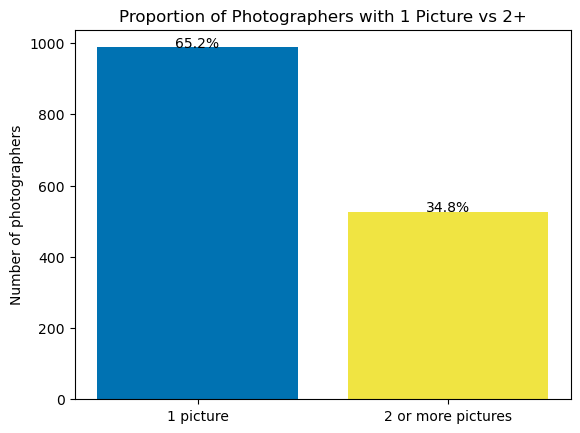

In [354]:
# group the DataFrame by Photographer_id and count the number of Pictures_id for each group
photographer_counts = main_merged.groupby('Photographer_id')['Pictures_id'].count()

# convert the photographer_counts series to a DataFrame
cphotographer_counts_df = photographer_counts.to_frame(name='picture_count')

# count the number of photographers with 1 picture and 2+ pictures
one_picture_count = sum(photographer_counts == 1)
two_or_more_count = sum(photographer_counts > 1)

# create a vertical bar chart of the photographer counts
x = ['1 picture', '2 or more pictures']
y = [one_picture_count, two_or_more_count]
plt.bar(x, y, color=['#0072B2', '#F0E442'])
plt.title('Proportion of Photographers with 1 Picture vs 2+')
plt.ylabel('Number of photographers')

# calculate and display the percentage on each bar
total_photographers = len(photographer_counts)
for i, v in enumerate(y):
    percentage = v / total_photographers * 100
    plt.text(i, v, f'{percentage:.1f}%', ha='center')

plt.show()

In [372]:
def categorize_pictures(picture_count):
    if picture_count >=2:
        return "Photographers who uploaded at least 2 pictures"
    else:
        return "1 picture"

# Apply the function to create a new column "orientation"
photographer_counts_df["1_or_2"] = photographer_counts_df["picture_count"].apply(categorize_pictures)

In [373]:
photographer_counts_df

,Photographer_id,picture_count,1_or_2
0,3,2,Photographers who uploaded at least 2 pictures
1,445,1,1 picture
2,487,4,Photographers who uploaded at least 2 pictures
3,493,4,Photographers who uploaded at least 2 pictures
4,1858,1,1 picture
5,2243,2,Photographers who uploaded at least 2 pictures
6,2421,5,Photographers who uploaded at least 2 pictures
7,2464,1,1 picture
8,2624,1,1 picture
9,2659,203,Photographers who uploaded at least 2 pictures


In [374]:
pictures_counts = photographer_counts_df.groupby("1_or_2")['picture_count'].sum()

# convert the photographer_counts series to a DataFrame
pictures_counts_df = pictures_counts.to_frame(name='picture_sum')

In [375]:
pictures_counts_df["picture_sum"]

1_or_2
1 picture                                          988
Photographers who uploaded at least 2 pictures    2694
Name: picture_sum, dtype: int64

In [297]:
527/1515

0.34785478547854787

In [376]:
photographer_counts_df = photographer_counts.reset_index(name='picture_count')
photographer_counts_df.shape

(1515, 2)

In [379]:
photographers_more_than_2 = photographer_counts_df[photographer_counts_df['picture_count'] >= 2]
photographers_more_than_2.shape

(527, 2)

In [288]:
photographers_more_than_2.head()

,Photographer_id,picture_count
2,487,4
3,493,4
6,2421,5
9,2659,203
11,2664,12


In [380]:
main_merged_filtered = main_merged[main_merged['Photographer_id'].isin(photographers_more_than_2['Photographer_id'])]
main_merged_filtered.shape

(2694, 18)

In [381]:
main_merged_filtered.head()

,Pictures_id,Width,Height,Full URL,Photographer_id,Description,Country_id,Country_name,region,sub-region,Hex,R,G,B,Photographer,Outlier,aspect_ratio,orientation
4,2363,1600,1066,https://www.pexels.com/photo/clear-glass-museum-during-golden-hour-2363/,2659,clear glass museum during golden hour,1,France,Europe,Western Europe,#8E5F38,142,95,56,pixabay,False,1.500938,landscape orientation
5,2886284,3328,4992,https://www.pexels.com/photo/white-and-brown-house-2886284/,557790,white and brown house,1,France,Europe,Western Europe,#2C4C57,44,76,87,vincent m.a. janssen,False,0.666667,portrait orientation
6,2901209,5966,3356,https://www.pexels.com/photo/canal-beside-houses-2901209/,651604,canal beside houses,1,France,Europe,Western Europe,#384859,56,72,89,pierre blache,False,1.777712,landscape orientation
8,3073666,3938,4923,https://www.pexels.com/photo/concrete-houses-and-green-trees-photo-3073666/,651604,concrete houses and green trees photo,1,France,Europe,Western Europe,#3E4642,62,70,66,pierre blache,False,0.799919,portrait orientation
9,2901215,5046,4037,https://www.pexels.com/photo/photography-of-buildings-and-canal-during-nighttime-2901215/,651604,photography of buildings and canal during nighttime,1,France,Europe,Western Europe,#273339,39,51,57,pierre blache,False,1.249938,other


In [390]:
# group the DataFrame by Photographer_id and calculate the count of Pictures_id and the count of unique Country_name values for each group
photographer_summary = main_merged_filtered.groupby('Photographer_id').agg(
    {'Pictures_id': 'count', 'Country_name': pd.Series.nunique, 'region': pd.Series.nunique})

# rename the columns
photographer_summary = photographer_summary.rename(columns={'Pictures_id': 'Picture_count', 'Country_name': 'Country_count', 'region': 'region_count'})

# sort the DataFrame by Picture_count in descending order
photographer_summary = photographer_summary.sort_values('Picture_count', ascending=False)

In [391]:
photographer_summary.head()

,Picture_count,Country_count,region_count
Photographer_id,,,
2659,203,40,5
1437723,47,3,2
1522664,46,7,3
102775,42,7,3
2272619,42,5,4


In [392]:
photographer_summary["Picture_count"].sum()

2694

In [393]:
2694/3682

0.7316675719717545

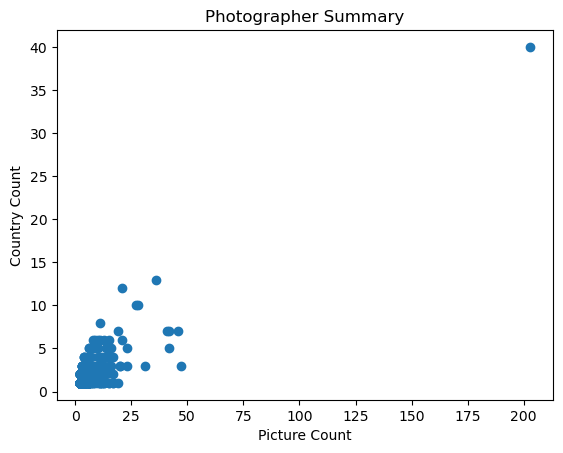

In [394]:
# create a scatter plot of Picture_count vs Country_count
plt.scatter(photographer_summary['Picture_count'], photographer_summary['Country_count'])

# add axis labels and a title
plt.xlabel('Picture Count')
plt.ylabel('Country Count')
plt.title('Photographer Summary')

# display the plot
plt.show()

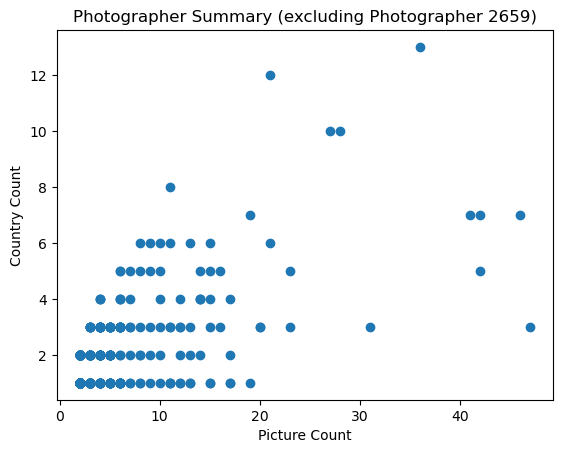

In [395]:
photographer_summary = photographer_summary.drop(index=2659)

# create a scatter plot of Picture_count vs Country_count
plt.scatter(photographer_summary['Picture_count'], photographer_summary['Country_count'])

# add axis labels and a title
plt.xlabel('Picture Count')
plt.ylabel('Country Count')
plt.title('Photographer Summary (excluding Photographer 2659)')

# display the plot
plt.show()

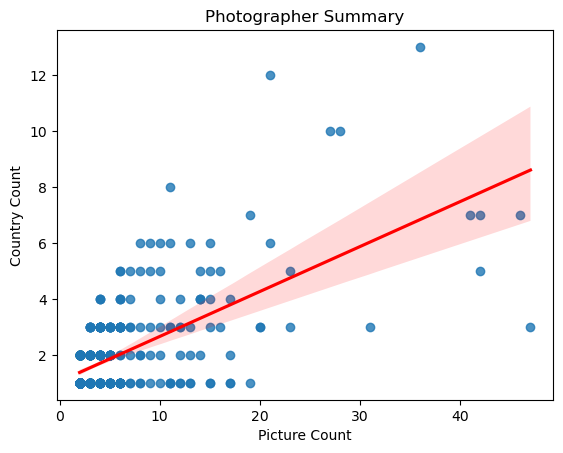

In [396]:
# create a regression plot of Picture_count vs Country_count
sns.regplot(x='Picture_count', y='Country_count', data=photographer_summary, line_kws={'color': 'red'})

# add axis labels and a title
plt.xlabel('Picture Count')
plt.ylabel('Country Count')
plt.title('Photographer Summary')

# display the plot
plt.show()

## NLP

In [435]:
main_merged["region"].value_counts()

Europe      1608
Asia        1386
Americas     318
Africa       293
Oceania       77
Name: region, dtype: int64

In [404]:
main_merged['Description'] = main_merged['Description'].astype(str)

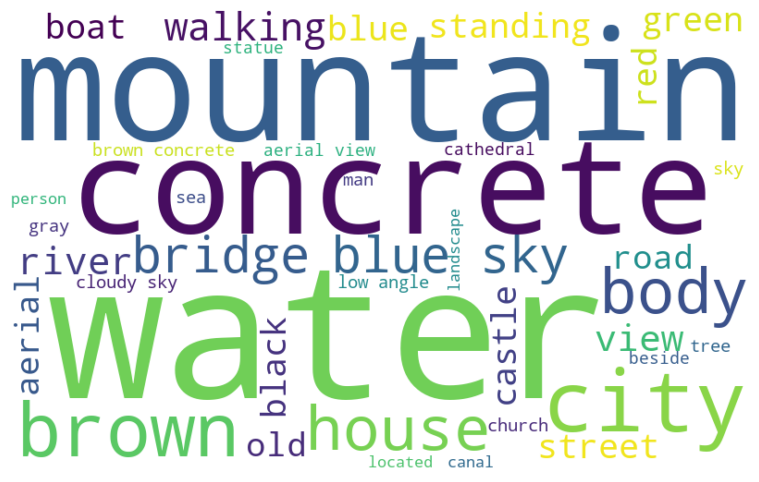

In [446]:
# filter main_merged to only include rows where region = "Europe"
europe_df = main_merged[main_merged['region'] == 'Europe']

# concatenate all descriptions into one string
all_desc = ' '.join(europe_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

# generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_words=40, stopwords=stopwords, background_color='white').generate(all_desc)

# plot the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

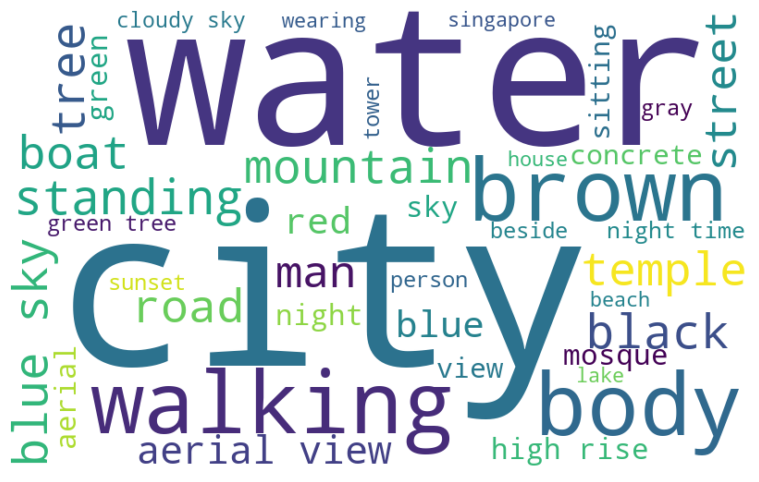

In [447]:
# filter main_merged to only include rows where region = "Europe"
asia_df = main_merged[main_merged['region'] == 'Asia']

# concatenate all descriptions into one string
all_desc = ' '.join(asia_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

# generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_words=40, stopwords=stopwords, background_color='white').generate(all_desc)

# plot the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

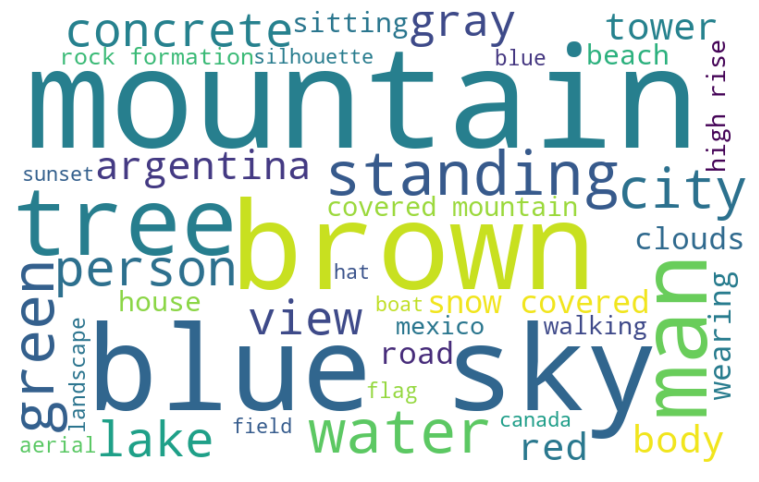

In [448]:
# filter main_merged to only include rows where region = "Europe"
americas_df = main_merged[main_merged['region'] == 'Americas']

# concatenate all descriptions into one string
all_desc = ' '.join(americas_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

# generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_words=40, stopwords=stopwords, background_color='white').generate(all_desc)

# plot the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

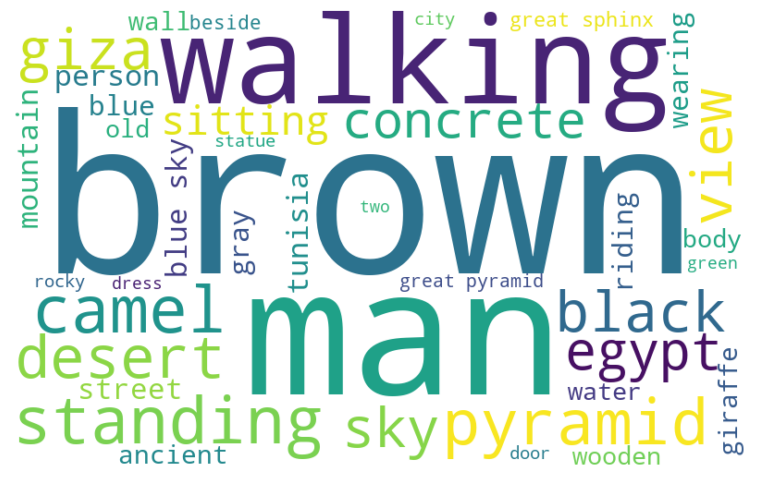

In [449]:
# filter main_merged to only include rows where region = "Europe"
africa_df = main_merged[main_merged['region'] == 'Africa']

# concatenate all descriptions into one string
all_desc = ' '.join(africa_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

# generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_words=40, stopwords=stopwords, background_color='white').generate(all_desc)

# plot the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

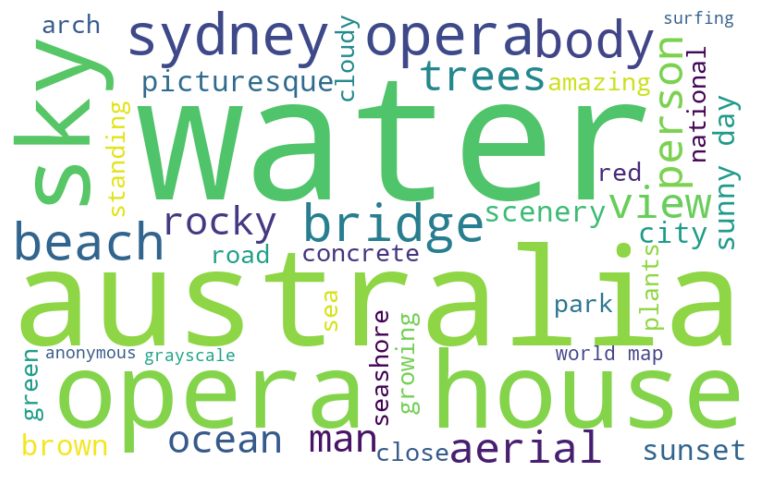

In [450]:
# filter main_merged to only include rows where region = "Europe"
oceania_df = main_merged[main_merged['region'] == 'Oceania']

# concatenate all descriptions into one string
all_desc = ' '.join(oceania_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

# generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_words=40, stopwords=stopwords, background_color='white').generate(all_desc)

# plot the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

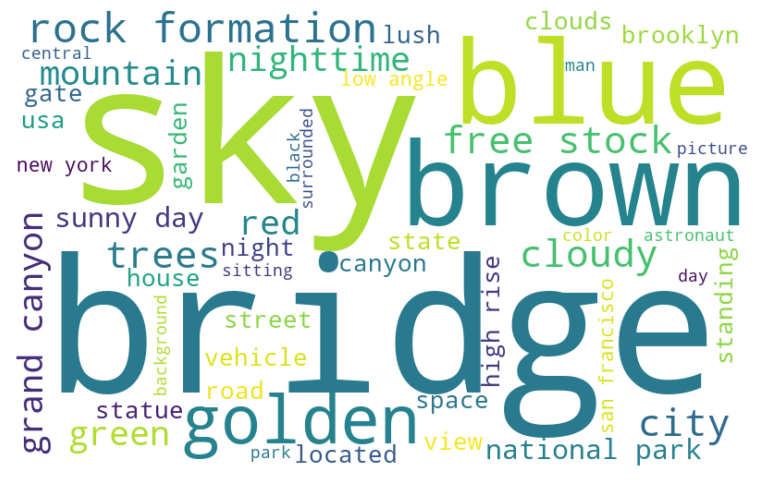

In [457]:
# filter main_merged to only include rows where region = "Europe"
europe_df = main_merged[main_merged['Country_name'] == 'United States']

# concatenate all descriptions into one string
all_desc = ' '.join(europe_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

# generate the word cloud
wordcloud = WordCloud(width=800, height=500, max_words=50, stopwords=stopwords, background_color='white').generate(all_desc)

# plot the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [469]:
# filter main_merged to only include rows where region = "Europe"
europe_df = main_merged[main_merged['region'] == 'Europe']

# concatenate all descriptions into one string
all_desc = ' '.join(europe_df['Description'])

# define stopwords to be excluded from the word cloud
stopwords = set(STOPWORDS)
stopwords.update(['the', 'a', 'an', 'in', 'on', 'and', 'with', 'for', 'of','photo', 'photography','near','white','building','buildings','people','woman'])

mask = np.array(Image.open("France.png"))
# Create a WordCloud object with the French flag mask image
wc = WordCloud(width=800, height=500, max_words=100, stopwords=stopwords, background_color='white', mask=mask,mode="RGBA")

# generate the word cloud
wordcloud = wc.generate(all_desc)

# plot the word cloud
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=(12,6))
plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation='bilinear')
plt.axis('off')
plt.show()

NotImplementedError: Gray-scale images TODO

<Figure size 1200x600 with 0 Axes>